In [1]:
import gc
import pathlib
from typing import Dict, List, Tuple, Union
import sys

from joblib import load
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import polars as pl
import seaborn as sns
from sklearn.metrics import average_precision_score, roc_auc_score
from sklearn.preprocessing import OrdinalEncoder

sys.path.append('..')

from scripts.evaluate import Evaluator
from scripts.get_depth_paths import get_depth_paths
from scripts.get_logger import get_logger
from scripts.merge_dataset import merge_dataset

gc.enable()
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', 100)

In [2]:
class PathHandler:
    competition_dir = pathlib.Path('../../inputs')
    parquet_files_dir = competition_dir.joinpath('parquet_files')
    feature_dir = pathlib.Path('../../outputs/features')
    model_dir = sorted(
        [p for p in pathlib.Path('../../outputs/output_catboost').glob('model_outputs*')]
    )[-1]


paths = PathHandler()

- P - Transform DPD (Days past due)
- M - Masking categories
- A - Transform amount
- D - Transform date
- T - Unspecified Transform
- L - Unspecified Transform

In [3]:
bool_features = pd.read_csv(paths.feature_dir.joinpath('bool_features.csv'))
float64_features = pd.read_csv(paths.feature_dir.joinpath('float64_features.csv'))
string_features = pd.read_csv(paths.feature_dir.joinpath('string_features.csv'))
date_features = pd.read_csv(paths.feature_dir.joinpath('date_features.csv'))

bool_features['cast_dtype'] = pl.Int8
float64_features['cast_dtype'] = pl.Float32
string_features['cast_dtype'] = pl.String
date_features['cast_dtype'] = pl.Date

cast_features = pd.concat([bool_features, float64_features, string_features])
display(cast_features)

,Variable,Description,train_num_unique_values,train_unique_types,train_num_nan,train_files,train_num_unique_types,test_num_unique_values,test_unique_types,test_num_nan,test_files,test_num_unique_types,transform,cast_dtype
0,remitter_829L,Flag indicating whether the client is a remitter.,2,bool,2168942,['person_1'],1,2,bool,7,['person_1'],1,L,Int8
1,contaddr_matchlist_1032L,Indicates whether the contact address is found in a code list.,2,bool,1447773,['person_1'],1,2,bool,7,['person_1'],1,L,Int8
2,isbidproduct_1095L,Flag indicating if the product is a cross-sell.,2,bool,0,['static_0'],1,2,bool,0,['static_0'],1,L,Int8
3,isdebitcard_729L,Flag indicating if the product is a debit card.,2,bool,1334357,['static_0'],1,2,bool,9,['static_0'],1,L,Int8
4,contaddr_smempladdr_334L,Indicates whether the contact address is the same as the employment address.,3,bool,1447773,['person_1'],1,2,bool,7,['person_1'],1,L,Int8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,addres_role_871L,Role of person's address.,9,str,1575736,['person_2'],1,1,NaN,10,['person_2'],0,L,String
95,cacccardblochreas_147M,Card blocking reason.,10,str,109249,['applprev_2'],1,1,NaN,10,['applprev_2'],0,M,String
96,relatedpersons_role_762T,"Relationship type of a client's related person (num_group1 - person, num_group2 - related person).",11,str,1614684,['person_2'],1,1,NaN,10,['person_2'],0,T,String
97,riskassesment_302T,Estimated probability that the client will default on their credit obligation within the next year.,17,str,1446917,['static_cb_0'],1,1,NaN,10,['static_cb_0'],0,T,String


In [4]:
display(string_features.query('transform=="M"'))

,Variable,Description,train_num_unique_values,train_unique_types,train_num_nan,train_files,train_num_unique_types,test_num_unique_values,test_unique_types,test_num_nan,test_files,test_num_unique_types,transform,cast_dtype
4,description_5085714M,Categorization of clients by credit bureau.,2,str,0,['static_cb_0'],1,2,str,0,['static_cb_0'],1,M,String
5,language1_981M,The primary language of the person.,3,str,0,['person_1'],1,3,str,0,['person_1'],1,M,String
16,collater_typofvalofguarant_298M,Collateral valuation type (active contract).,5,str,0,['credit_bureau_a_2'],1,3,str,0,['credit_bureau_a_2'],1,M,String
17,education_88M,Education level of the client.,5,str,0,['static_cb_0'],1,1,str,0,['static_cb_0'],1,M,String
18,education_1103M,Level of education of the client provided by external source.,5,str,0,['static_cb_0'],1,2,str,0,['static_cb_0'],1,M,String
19,subjectrole_43M,Subject role in closed credit contract.,6,str,0,['credit_bureau_b_1'],1,2,str,0,['credit_bureau_b_1'],1,M,String
20,subjectrole_326M,Subject role in active credit contract.,6,str,0,['credit_bureau_b_1'],1,2,str,0,['credit_bureau_b_1'],1,M,String
21,maritalst_893M,Marital status of the client,6,str,0,['static_cb_0'],1,1,str,0,['static_cb_0'],1,M,String
22,education_1138M,Applicant's education level from their previous application.,6,str,0,['applprev_1'],1,4,str,0,['applprev_1'],1,M,String
23,education_927M,Education level of the person.,6,str,0,['person_1'],1,2,str,0,['person_1'],1,M,String


### load feature definition, out-of-fold and feature importances.

In [5]:
feature_definition = pd.read_csv(paths.competition_dir.joinpath('feature_definitions.csv'))
oof = pd.read_csv(paths.model_dir.joinpath('oof.csv'))
outcome = pd.read_csv(paths.model_dir.joinpath('outcome.csv'))
fimps = pd.read_csv(paths.model_dir.joinpath('feature_importances.csv'), index_col='processed_Variable')

base_variables = []
for v1 in feature_definition['Variable'].to_list():
    for v2 in fimps.index.to_list():
        if v1 in v2:
            base_variables.append((v2, v1))
base_variables = pd.DataFrame(base_variables)
base_variables.columns = ['processed_Variable', 'Variable']
fimps = fimps.merge(base_variables, on='processed_Variable')
fimps = fimps.merge(feature_definition, left_on='Variable', right_on='Variable')
fimps['transform'] = fimps['Variable'].map(lambda x: x[-1])
fimps['depth'] = fimps['processed_Variable'].map(lambda x: x[-1])

display(fimps)
display(feature_definition)
display(oof)
display(outcome)

,processed_Variable,fold_1_fimp,fold_2_fimp,fold_3_fimp,fold_4_fimp,fold_5_fimp,fimp_mean,fimp_std,Variable,Description,transform,depth
0,sum_ratio_pmts_month_158T_2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,pmts_month_158T,"Month of payment for a closed contract (num_group1 - existing contract, num_group2 - payment).",T,2
1,first_maritalst_703L_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,maritalst_703L,Marital status of the client.,L,1
2,first_relationshiptoclient_415T_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,relationshiptoclient_415T,Relationship to the client.,T,1
3,first_relationshiptoclient_642T_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,relationshiptoclient_642T,Relationship to the client.,T,1
4,first_role_993L_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,role_993L,Person's role.,L,1
...,...,...,...,...,...,...,...,...,...,...,...,...
700,avgdpdtolclosure24_3658938P_0,1.737317,2.578750,1.200355,1.630328,2.521031,1.933556,0.534685,avgdpdtolclosure24_3658938P,"Average DPD (days past due) with tolerance within the past 24 months from the maximum closure date, assuming that the contract is finished. If the contract is ongoing, the calculation is based on the current date.",P,0
701,price_1097A_0,2.223880,1.989585,1.874570,2.005679,1.954923,2.009727,0.116237,price_1097A,Credit price.,A,0
702,first_sex_738L_1,2.015124,2.081556,1.792322,2.164064,2.114735,2.033560,0.129969,sex_738L,Gender of the client.,L,1
703,year_first_birth_259D_1,1.962546,2.158268,2.101806,2.182146,2.303296,2.141612,0.111096,birth_259D,Date of birth of the person.,D,1


,Variable,Description
0,actualdpd_943P,Days Past Due (DPD) of previous contract (actual).
1,actualdpdtolerance_344P,DPD of client with tolerance.
2,addres_district_368M,District of the person's address.
3,addres_role_871L,Role of person's address.
4,addres_zip_823M,Zip code of the address.
...,...,...
460,totinstallast1m_4525188A,Total amount of monthly instalments paid in the previous month.
461,twobodfilling_608L,Type of application process.
462,type_25L,Contact type of a person.
463,typesuite_864L,Persons accompanying the client during the loan application process.


,case_id,date_decision,MONTH,WEEK_NUM,target,probability,fold
0,0,2019-01-03,201901,0,0,0.037162,0.0
1,1,2019-01-03,201901,0,0,0.058936,0.0
2,2,2019-01-04,201901,0,0,0.073140,0.0
3,3,2019-01-03,201901,0,0,0.093887,0.0
4,4,2019-01-04,201901,0,1,0.075008,0.0
...,...,...,...,...,...,...,...
1526654,2703450,2020-10-05,202010,91,0,0.001599,0.0
1526655,2703451,2020-10-05,202010,91,0,0.006534,0.0
1526656,2703452,2020-10-05,202010,91,0,0.042835,0.0
1526657,2703453,2020-10-05,202010,91,0,0.002541,0.0


,stability,slope,intercept
0,0.689529,0.000743,0.670172


### show feature importances

,processed_Variable,fold_1_fimp,fold_2_fimp,fold_3_fimp,fold_4_fimp,fold_5_fimp,fimp_mean,fimp_std,Variable,Description,transform,depth
0,sum_ratio_pmts_month_158T_2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,pmts_month_158T,"Month of payment for a closed contract (num_group1 - existing contract, num_group2 - payment).",T,2
28,paytype1st_925L_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,paytype1st_925L,Type of first payment of the client.,L,0
27,ratio_periodicityofpmts_837L_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,periodicityofpmts_837L,Frequency of instalments for an active contract.,L,1
26,max_persontype_792L_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,persontype_792L,Person type.,L,1
25,ratio_mainoccupationinc_384A_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,mainoccupationinc_384A,Amount of the main income of the client.,A,1
...,...,...,...,...,...,...,...,...,...,...,...,...
700,avgdpdtolclosure24_3658938P_0,1.737317,2.578750,1.200355,1.630328,2.521031,1.933556,0.534685,avgdpdtolclosure24_3658938P,"Average DPD (days past due) with tolerance within the past 24 months from the maximum closure date, assuming that the contract is finished. If the contract is ongoing, the calculation is based on the current date.",P,0
701,price_1097A_0,2.223880,1.989585,1.874570,2.005679,1.954923,2.009727,0.116237,price_1097A,Credit price.,A,0
702,first_sex_738L_1,2.015124,2.081556,1.792322,2.164064,2.114735,2.033560,0.129969,sex_738L,Gender of the client.,L,1
703,year_first_birth_259D_1,1.962546,2.158268,2.101806,2.182146,2.303296,2.141612,0.111096,birth_259D,Date of birth of the person.,D,1


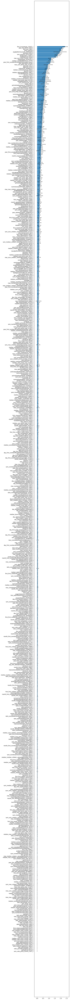

In [6]:
fimps.sort_values('fimp_mean', inplace=True)
display(fimps)

_, ax = plt.subplots(figsize=(8, 16*(len(fimps)//100)))
ax.barh(y=fimps['processed_Variable'], width=fimps['fimp_mean'], xerr=fimps['fimp_std'], capsize=3)
plt.tight_layout()
plt.show()

In [7]:
fimp_q50 = fimps['fimp_mean'].quantile(0.75)
print(fimp_q50)

fimps['smaller_than_q50'] = fimps['fimp_mean'] < fimp_q50
display(fimps)
display(fimps['smaller_than_q50'].sum())

0.1257388093696073


,processed_Variable,fold_1_fimp,fold_2_fimp,fold_3_fimp,fold_4_fimp,fold_5_fimp,fimp_mean,fimp_std,Variable,Description,transform,depth,smaller_than_q50
0,sum_ratio_pmts_month_158T_2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,pmts_month_158T,"Month of payment for a closed contract (num_group1 - existing contract, num_group2 - payment).",T,2,True
28,paytype1st_925L_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,paytype1st_925L,Type of first payment of the client.,L,0,True
27,ratio_periodicityofpmts_837L_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,periodicityofpmts_837L,Frequency of instalments for an active contract.,L,1,True
26,max_persontype_792L_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,persontype_792L,Person type.,L,1,True
25,ratio_mainoccupationinc_384A_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,mainoccupationinc_384A,Amount of the main income of the client.,A,1,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
700,avgdpdtolclosure24_3658938P_0,1.737317,2.578750,1.200355,1.630328,2.521031,1.933556,0.534685,avgdpdtolclosure24_3658938P,"Average DPD (days past due) with tolerance within the past 24 months from the maximum closure date, assuming that the contract is finished. If the contract is ongoing, the calculation is based on the current date.",P,0,False
701,price_1097A_0,2.223880,1.989585,1.874570,2.005679,1.954923,2.009727,0.116237,price_1097A,Credit price.,A,0,False
702,first_sex_738L_1,2.015124,2.081556,1.792322,2.164064,2.114735,2.033560,0.129969,sex_738L,Gender of the client.,L,1,False
703,year_first_birth_259D_1,1.962546,2.158268,2.101806,2.182146,2.303296,2.141612,0.111096,birth_259D,Date of birth of the person.,D,1,False


528

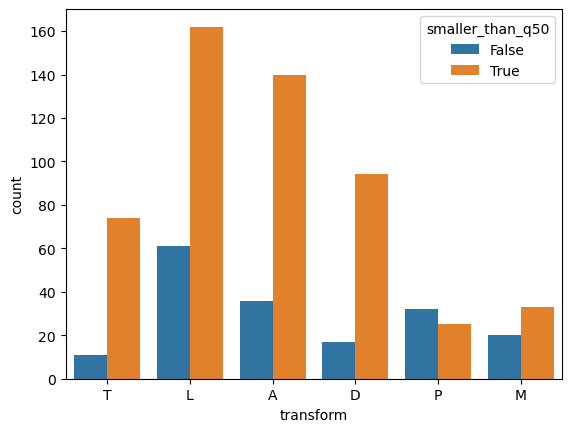

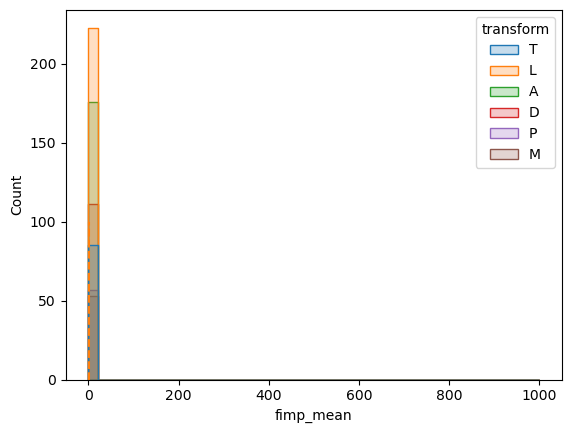

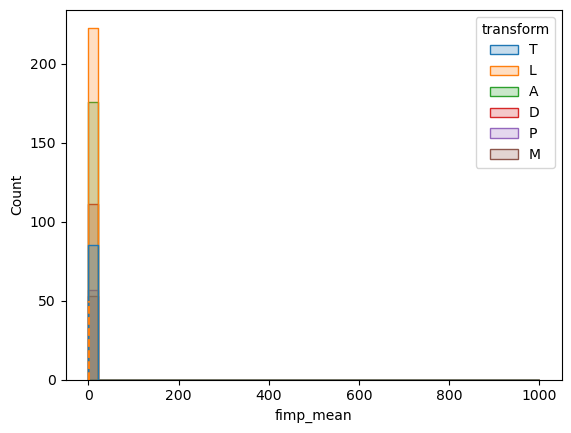

In [8]:
sns.countplot(data=fimps, x='transform', hue='smaller_than_q50')
plt.show()

_, ax = plt.subplots()
bins = np.linspace(0, 1000, 50)
sns.histplot(data=fimps, x='fimp_mean', hue='transform', element='step', bins=bins, ax=ax)
ax.vlines(fimp_q50, ymin=0, ymax=100, color='tab:orange', linestyles='dashed')
plt.show()

_, ax = plt.subplots()
bins = np.linspace(0, 1000, 50)
sns.histplot(data=fimps, x='fimp_mean', hue='transform', element='step', bins=bins, ax=ax)
ax.vlines(fimp_q50, ymin=0, ymax=50, color='tab:orange', linestyles='dashed')
plt.show()

### load train data

In [9]:
train_depth_paths = get_depth_paths(paths.parquet_files_dir, 'train')
print(f'number of test paths: {sum(len(v1) for v1 in train_depth_paths.values())}')

train_base_data = pl.read_parquet(
    paths.parquet_files_dir.joinpath('train/train_base.parquet')
)
train_base_data = train_base_data.cast(
    {
        'case_id': pl.Int64,
        'date_decision': pl.String,
        'MONTH': pl.Int64,
        'WEEK_NUM': pl.Int64,
        'target': pl.Int64,
    }
)
display(train_base_data)

number of test paths: 31


case_id,date_decision,MONTH,WEEK_NUM,target
i64,str,i64,i64,i64
0,"""2019-01-03""",201901,0,0
1,"""2019-01-03""",201901,0,0
2,"""2019-01-04""",201901,0,0
3,"""2019-01-03""",201901,0,0
4,"""2019-01-04""",201901,0,1
…,…,…,…,…
2703450,"""2020-10-05""",202010,91,0
2703451,"""2020-10-05""",202010,91,0
2703452,"""2020-10-05""",202010,91,0


In [10]:
%%time


depth_data = merge_dataset(
    train_base_data,
    train_depth_paths,
    bool_features,
    float64_features,
    string_features,
    date_features,
    None,
    '012'
)
display(depth_data)
display(depth_data.dtypes.value_counts())

loading `static_0`
	(1003757, 168)
	(522902, 168)
loading `static_cb_0`
	(1500476, 53)
loading `applprev_1`
	(782997, 92)
	(438525, 92)
loading `other_1`
	(51109, 21)
loading `tax_registry_a_1`
	(457934, 7)
loading `tax_registry_b_1`
	(150732, 7)
loading `tax_registry_c_1`
	(482265, 7)
loading `credit_bureau_a_1`
	(335275, 240)
	(549263, 240)
	(325127, 240)
	(176608, 240)
loading `credit_bureau_b_1`
	(36500, 134)
loading `deposit_1`
	(105111, 7)
loading `person_1`
	(1526659, 46)
loading `debitcard_1`
	(111772, 14)
loading `applprev_2`
	(1221522, 4)
loading `person_2`
	(1435105, 9)
loading `credit_bureau_a_2`
	(98303, 127)
	(118481, 127)
	(23734, 127)
	(156749, 127)
	(190486, 127)
	(190313, 127)
	(231250, 127)
	(150426, 127)
	(45056, 127)
	(77457, 127)
	(103033, 127)
loading `credit_bureau_b_2`
	(36447, 26)


,case_id,date_decision,MONTH,WEEK_NUM,target,actualdpdtolerance_344P_0,amtinstpaidbefduel24m_4187115A_0,annuity_780A_0,annuitynextmonth_57A_0,applicationcnt_361L_0,...,day_first_contractmaturitydate_151D_1,day_first_lastupdate_260D_1,day_first_contractenddate_991D_1,day_first_openingdate_313D_1,day_first_birth_259D_1,day_first_birthdate_87D_1,day_first_empl_employedfrom_271D_1,day_first_openingdate_857D_1,day_first_first_empls_employedfrom_796D_2,day_first_first_pmts_date_1107D_2
0,0,2019-01-03,201901,0,0,NaN,NaN,1917.599976,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,15.0,NaN,NaN,NaN
1,1,2019-01-03,201901,0,0,NaN,NaN,3134.000000,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,29.0,NaN,NaN,NaN
2,2,2019-01-04,201901,0,0,NaN,NaN,4937.000000,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,15.0,NaN,NaN,NaN
3,3,2019-01-03,201901,0,0,NaN,NaN,4643.600098,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,15.0,NaN,NaN,NaN
4,4,2019-01-04,201901,0,1,NaN,NaN,3390.199951,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,15.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1526654,2703450,2020-10-05,202010,91,0,0.0,176561.359375,3675.400146,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1526655,2703451,2020-10-05,202010,91,0,0.0,301276.468750,7088.600098,6191.600098,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1526656,2703452,2020-10-05,202010,91,0,0.0,14232.400391,7788.800293,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1526657,2703453,2020-10-05,202010,91,0,0.0,197371.578125,1195.400024,2827.199951,0.0,...,NaN,NaN,28.0,29.0,1.0,NaN,NaN,29.0,NaN,NaN


float32    955
object     100
int8         6
int64        4
Name: count, dtype: int64

CPU times: user 16min 30s, sys: 34.6 s, total: 17min 4s
Wall time: 1min 5s


In [11]:
nans = (depth_data.isna().sum() / len(depth_data)).reset_index()
nans.columns = ['processed_Variable', 'ratio_nan']

display(fimps)
display(nans)

fimps = fimps.merge(nans, on='processed_Variable', how='left')
display(fimps)

,processed_Variable,fold_1_fimp,fold_2_fimp,fold_3_fimp,fold_4_fimp,fold_5_fimp,fimp_mean,fimp_std,Variable,Description,transform,depth,smaller_than_q50
0,sum_ratio_pmts_month_158T_2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,pmts_month_158T,"Month of payment for a closed contract (num_group1 - existing contract, num_group2 - payment).",T,2,True
28,paytype1st_925L_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,paytype1st_925L,Type of first payment of the client.,L,0,True
27,ratio_periodicityofpmts_837L_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,periodicityofpmts_837L,Frequency of instalments for an active contract.,L,1,True
26,max_persontype_792L_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,persontype_792L,Person type.,L,1,True
25,ratio_mainoccupationinc_384A_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,mainoccupationinc_384A,Amount of the main income of the client.,A,1,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
700,avgdpdtolclosure24_3658938P_0,1.737317,2.578750,1.200355,1.630328,2.521031,1.933556,0.534685,avgdpdtolclosure24_3658938P,"Average DPD (days past due) with tolerance within the past 24 months from the maximum closure date, assuming that the contract is finished. If the contract is ongoing, the calculation is based on the current date.",P,0,False
701,price_1097A_0,2.223880,1.989585,1.874570,2.005679,1.954923,2.009727,0.116237,price_1097A,Credit price.,A,0,False
702,first_sex_738L_1,2.015124,2.081556,1.792322,2.164064,2.114735,2.033560,0.129969,sex_738L,Gender of the client.,L,1,False
703,year_first_birth_259D_1,1.962546,2.158268,2.101806,2.182146,2.303296,2.141612,0.111096,birth_259D,Date of birth of the person.,D,1,False


,processed_Variable,ratio_nan
0,case_id,0.000000
1,date_decision,0.000000
2,MONTH,0.000000
3,WEEK_NUM,0.000000
4,target,0.000000
...,...,...
1060,day_first_birthdate_87D_1,0.991840
1061,day_first_empl_employedfrom_271D_1,0.628797
1062,day_first_openingdate_857D_1,0.932508
1063,day_first_first_empls_employedfrom_796D_2,0.998207


,processed_Variable,fold_1_fimp,fold_2_fimp,fold_3_fimp,fold_4_fimp,fold_5_fimp,fimp_mean,fimp_std,Variable,Description,transform,depth,smaller_than_q50,ratio_nan
0,sum_ratio_pmts_month_158T_2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,pmts_month_158T,"Month of payment for a closed contract (num_group1 - existing contract, num_group2 - payment).",T,2,True,0.092602
1,paytype1st_925L_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,paytype1st_925L,Type of first payment of the client.,L,0,True,0.000000
2,ratio_periodicityofpmts_837L_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,periodicityofpmts_837L,Frequency of instalments for an active contract.,L,1,True,0.696203
3,max_persontype_792L_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,persontype_792L,Person type.,L,1,True,0.000000
4,ratio_mainoccupationinc_384A_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,mainoccupationinc_384A,Amount of the main income of the client.,A,1,True,0.000006
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
700,avgdpdtolclosure24_3658938P_0,1.737317,2.578750,1.200355,1.630328,2.521031,1.933556,0.534685,avgdpdtolclosure24_3658938P,"Average DPD (days past due) with tolerance within the past 24 months from the maximum closure date, assuming that the contract is finished. If the contract is ongoing, the calculation is based on the current date.",P,0,False,0.306011
701,price_1097A_0,2.223880,1.989585,1.874570,2.005679,1.954923,2.009727,0.116237,price_1097A,Credit price.,A,0,False,0.146228
702,first_sex_738L_1,2.015124,2.081556,1.792322,2.164064,2.114735,2.033560,0.129969,sex_738L,Gender of the client.,L,1,False,0.000000
703,year_first_birth_259D_1,1.962546,2.158268,2.101806,2.182146,2.303296,2.141612,0.111096,birth_259D,Date of birth of the person.,D,1,False,0.000000


#### plot feature importance per transform type

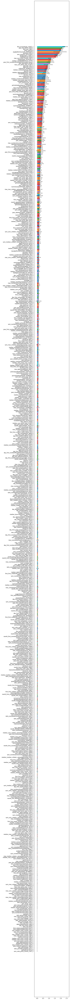

In [12]:
colors = np.array(['tab:orange'] * len(fimps))
colors[fimps['transform']=='A'] = 'tab:blue'
colors[fimps['transform']=='D'] = 'tab:green'
colors[fimps['transform']=='L'] = 'tab:red'
colors[fimps['transform']=='M'] = 'tab:purple'
colors[fimps['transform']=='T'] = 'tab:cyan'

_, ax = plt.subplots(figsize=(8, 16*len(fimps)//100))
ax.barh(
    y=fimps['processed_Variable'],
    width=fimps['fimp_mean'],
    xerr=fimps['fimp_std'],
    capsize=3,
    color=colors,
)
plt.tight_layout()
#plt.xscale('log')
plt.show()

#### plot feature importance per depth

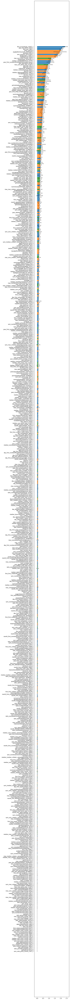

In [13]:
colors = np.array(['tab:orange'] * len(fimps))
colors[fimps['depth']=='1'] = 'tab:blue'
colors[fimps['depth']=='2'] = 'tab:green'

_, ax = plt.subplots(figsize=(8, 16*len(fimps)//100))
ax.barh(
    y=fimps['processed_Variable'],
    width=fimps['fimp_mean'],
    xerr=fimps['fimp_std'],
    capsize=3,
    color=colors,
)
plt.tight_layout()
#plt.xscale('log')
plt.show()

#### plot feature importance per number of nan

,processed_Variable,fold_1_fimp,fold_2_fimp,fold_3_fimp,fold_4_fimp,fold_5_fimp,fimp_mean,fimp_std,Variable,Description,transform,depth,smaller_than_q50,ratio_nan
0,sum_ratio_pmts_month_158T_2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,pmts_month_158T,"Month of payment for a closed contract (num_group1 - existing contract, num_group2 - payment).",T,2,True,0.092602
1,paytype1st_925L_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,paytype1st_925L,Type of first payment of the client.,L,0,True,0.000000
2,ratio_periodicityofpmts_837L_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,periodicityofpmts_837L,Frequency of instalments for an active contract.,L,1,True,0.696203
3,max_persontype_792L_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,persontype_792L,Person type.,L,1,True,0.000000
4,ratio_mainoccupationinc_384A_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,mainoccupationinc_384A,Amount of the main income of the client.,A,1,True,0.000006
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
700,avgdpdtolclosure24_3658938P_0,1.737317,2.578750,1.200355,1.630328,2.521031,1.933556,0.534685,avgdpdtolclosure24_3658938P,"Average DPD (days past due) with tolerance within the past 24 months from the maximum closure date, assuming that the contract is finished. If the contract is ongoing, the calculation is based on the current date.",P,0,False,0.306011
701,price_1097A_0,2.223880,1.989585,1.874570,2.005679,1.954923,2.009727,0.116237,price_1097A,Credit price.,A,0,False,0.146228
702,first_sex_738L_1,2.015124,2.081556,1.792322,2.164064,2.114735,2.033560,0.129969,sex_738L,Gender of the client.,L,1,False,0.000000
703,year_first_birth_259D_1,1.962546,2.158268,2.101806,2.182146,2.303296,2.141612,0.111096,birth_259D,Date of birth of the person.,D,1,False,0.000000


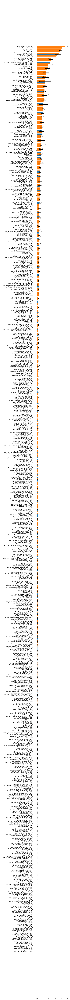

In [14]:
display(fimps)

colors = np.array(['tab:orange'] * len(fimps))
colors[fimps['ratio_nan'] > 0.5] = 'tab:blue'

_, ax = plt.subplots(figsize=(8, 16*len(fimps)//100))
ax.barh(
    y=fimps['processed_Variable'],
    width=fimps['fimp_mean'],
    xerr=fimps['fimp_std'],
    capsize=3,
    color=colors,
)
plt.tight_layout()
#plt.xscale('log')
plt.show()

#### plot feature importance per number of nan

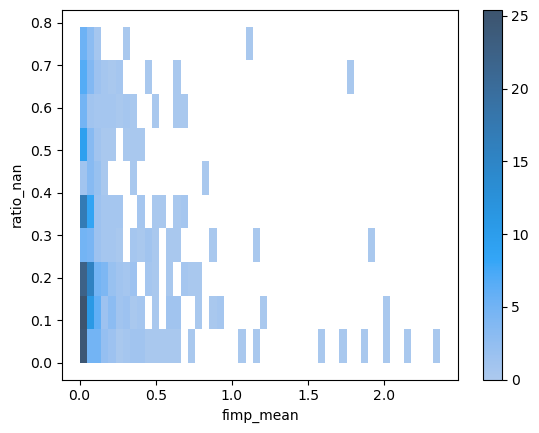

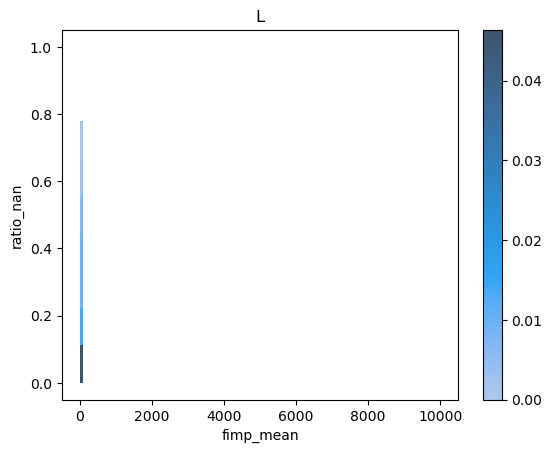

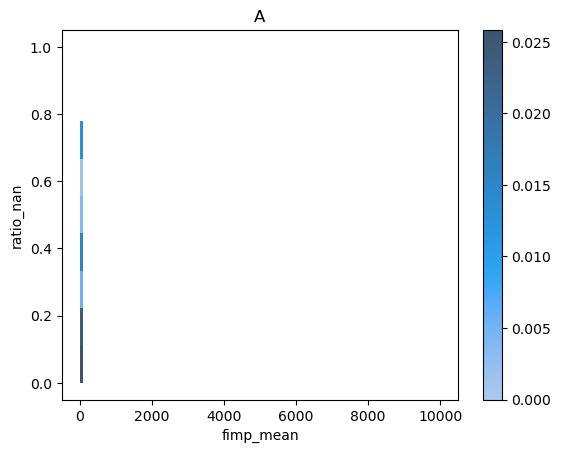

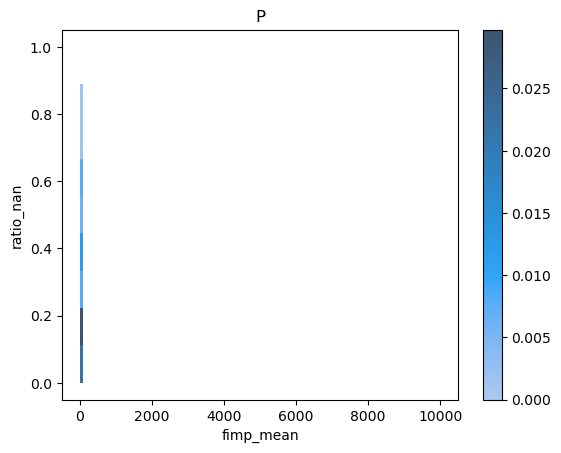

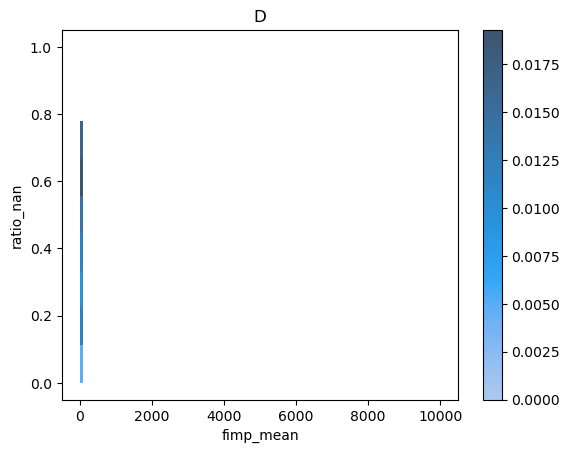

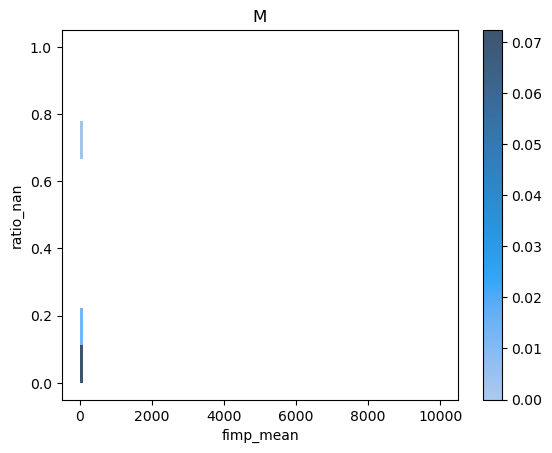

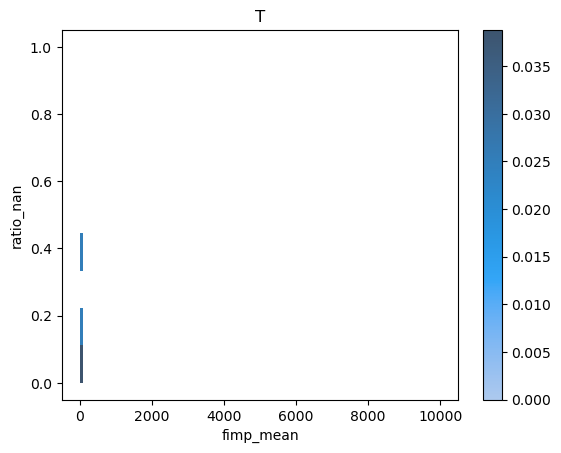

In [15]:
sns.histplot(
    data=fimps,
    x='fimp_mean',
    y='ratio_nan',
    bins=(50, 10),
    stat='density',
    cbar=True,
)
plt.show()


for t in ['L', 'A', 'P', 'D', 'M', 'T']:
    ax = sns.histplot(
        data=fimps.query('transform==@t'),
        x='fimp_mean',
        y='ratio_nan',
        bins=(np.linspace(0, 10000, 100), np.linspace(0, 1, 10)),
        stat='density',
        cbar=True,
    )
    ax.set_title(t)
    plt.show()

#### plot M features

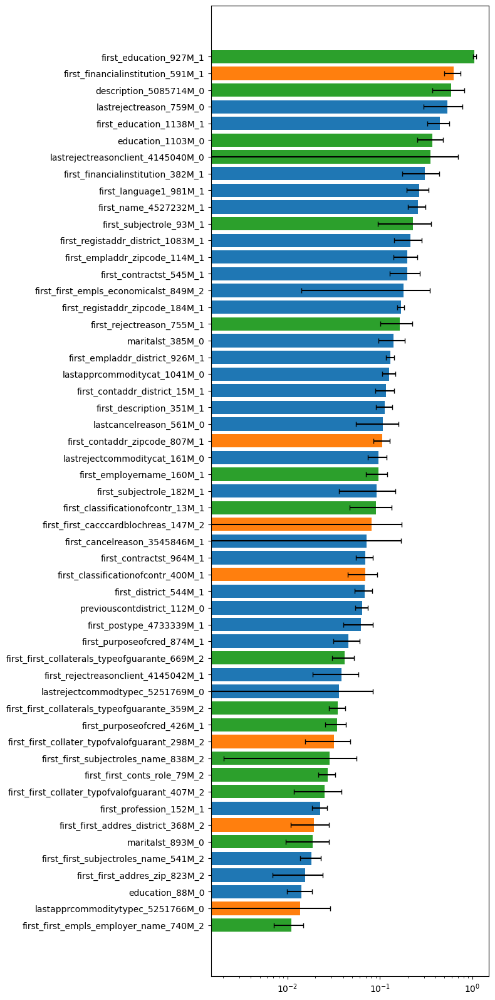

In [16]:
colors = np.array(['tab:orange'] * len(fimps))
colors[fimps['processed_Variable'].str.endswith('1')] = 'tab:blue'
colors[fimps['processed_Variable'].str.endswith('2')] = 'tab:green'

_, ax = plt.subplots(figsize=(8, 16))
ax.barh(
    y=fimps.query('transform=="M"')['processed_Variable'],
    width=fimps.query('transform=="M"')['fimp_mean'],
    xerr=fimps.query('transform=="M"')['fimp_std'],
    capsize=3,
    color=colors,
)
plt.tight_layout()
plt.xscale('log')
plt.show()

#### plot top k features

,processed_Variable,fimp_mean,Variable,Description,transform,depth
0,first_incometype_1044T_1,2.367110,incometype_1044T,Type of income of the person,T,1
1,year_first_birth_259D_1,2.141612,birth_259D,Date of birth of the person.,D,1
2,first_sex_738L_1,2.033560,sex_738L,Gender of the client.,L,1
3,price_1097A_0,2.009727,price_1097A,Credit price.,A,0
4,avgdpdtolclosure24_3658938P_0,1.933556,avgdpdtolclosure24_3658938P,"Average DPD (days past due) with tolerance within the past 24 months from the maximum closure date, assuming that the contract is finished. If the contract is ongoing, the calculation is based on the current date.",P,0
5,pmtnum_254L_0,1.873045,pmtnum_254L,Total number of loan payments made by the client.,L,0
6,sum_amount_4527230A_1,1.756191,amount_4527230A,Tax deductions amount tracked by the government registry.,A,1
7,isbidproduct_1095L_0,1.717822,isbidproduct_1095L,Flag indicating if the product is a cross-sell.,L,0
8,mobilephncnt_593L_0,1.594627,mobilephncnt_593L,Number of persons with the same mobile phone number.,L,0
9,max_sum_pmts_month_158T_2,1.192817,pmts_month_158T,"Month of payment for a closed contract (num_group1 - existing contract, num_group2 - payment).",T,2


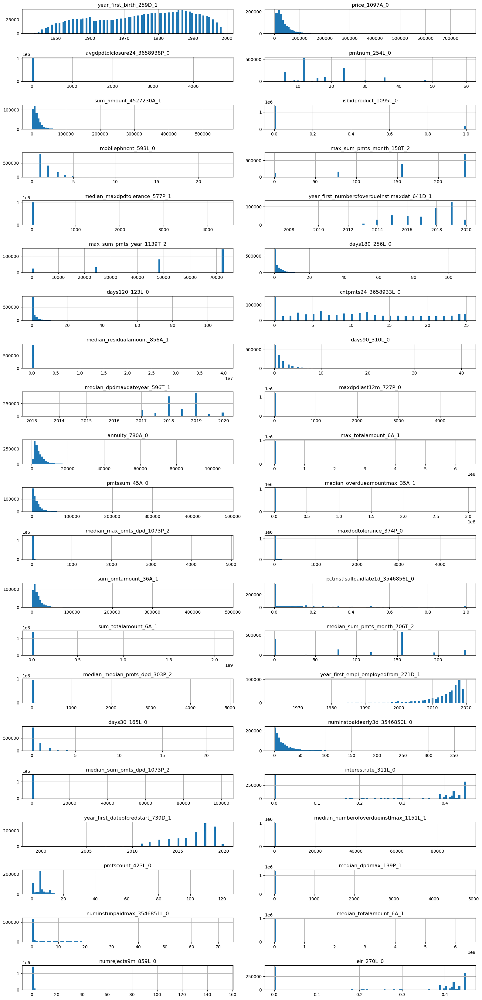

In [17]:
k = 50
topk_features = fimps.sort_values('fimp_mean', ascending=False).reset_index(drop=True).iloc[:k]
display(topk_features[['processed_Variable', 'fimp_mean', 'Variable', 'Description', 'transform', 'depth']])

_ = depth_data[topk_features['processed_Variable'].to_list()].hist(bins=100, layout=(len(topk_features)+1, 2), figsize=(16, 16*5))
plt.tight_layout()
plt.show()

,processed_Variable,fimp_mean,Variable,Description,transform,depth
3,price_1097A_0,2.009727,price_1097A,Credit price.,A,0
4,avgdpdtolclosure24_3658938P_0,1.933556,avgdpdtolclosure24_3658938P,"Average DPD (days past due) with tolerance within the past 24 months from the maximum closure date, assuming that the contract is finished. If the contract is ongoing, the calculation is based on the current date.",P,0
5,pmtnum_254L_0,1.873045,pmtnum_254L,Total number of loan payments made by the client.,L,0
7,isbidproduct_1095L_0,1.717822,isbidproduct_1095L,Flag indicating if the product is a cross-sell.,L,0
8,mobilephncnt_593L_0,1.594627,mobilephncnt_593L,Number of persons with the same mobile phone number.,L,0
10,requesttype_4525192L_0,1.174264,requesttype_4525192L,Tax authority request type.,L,0
15,days180_256L_0,0.900057,days180_256L,Number of credit bureau queries for last 180 days.,L,0
16,days120_123L_0,0.888364,days120_123L,Number of credit bureau queries for the last 120 days.,L,0
17,cntpmts24_3658933L_0,0.870756,cntpmts24_3658933L,Number of months with any incoming payment in last 24 months.,L,0
19,days90_310L_0,0.771603,days90_310L,Number of credit bureau queries for the last 90 days.,L,0


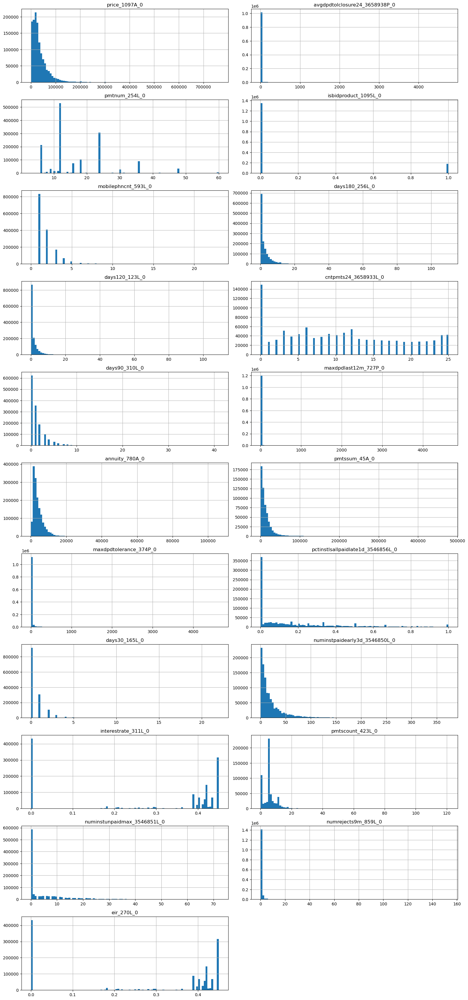

In [18]:
k = 50
topk_features = fimps.sort_values('fimp_mean', ascending=False).reset_index(drop=True).iloc[:k].query('depth=="0"')
display(topk_features[['processed_Variable', 'fimp_mean', 'Variable', 'Description', 'transform', 'depth']])

_ = depth_data[topk_features['processed_Variable'].to_list()].hist(bins=100, layout=(len(topk_features)+1, 2), figsize=(16, 16*5))
plt.tight_layout()
plt.show()

### plot probability per week

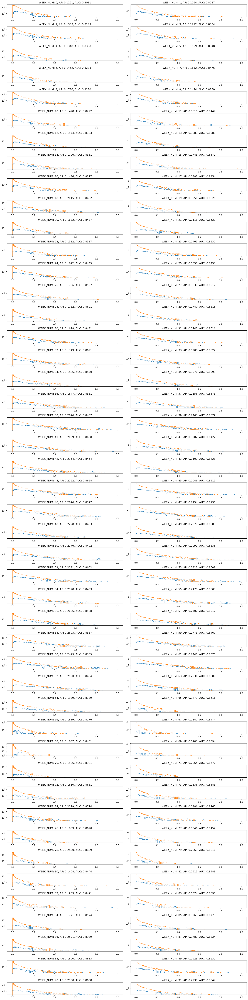

In [19]:
def plot_probability(oof):
    _, axs = plt.subplots(92//2, 2, figsize=(16, 64))
    bins = np.linspace(0, 1, 100)
    for i, (_, g) in enumerate(oof.groupby('WEEK_NUM')[['probability', 'target']]):
        ap = average_precision_score(g['target'], g['probability'])
        auc = roc_auc_score(g['target'], g['probability'])
        axs[i//2, i%2].hist(g.query('target==1')['probability'], bins=bins, histtype='step')
        axs[i//2, i%2].hist(g.query('target==0')['probability'], bins=bins, histtype='step')
        axs[i//2, i%2].set_yscale('log')
        axs[i//2, i%2].set_title(f'WEEK_NUM: {i}, AP: {ap:.4f}, AUC: {auc:.4f}')
    plt.tight_layout()
    plt.show()


plot_probability(oof)

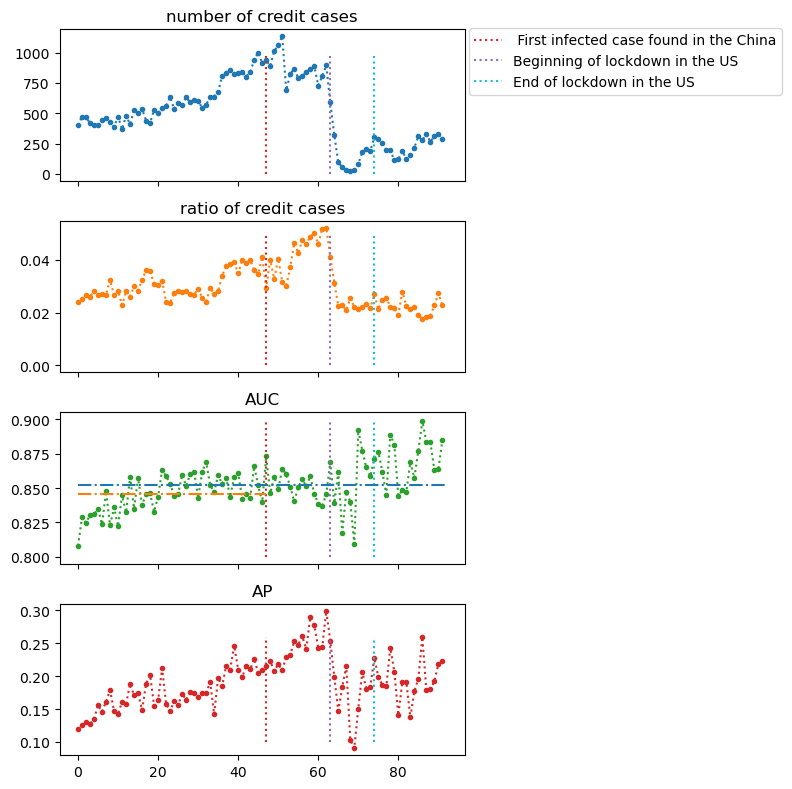

In [20]:
num_target_per_week = oof.groupby('WEEK_NUM')['target'].sum()
ratio_target_per_week = oof.groupby('WEEK_NUM')['target'].agg(lambda x: x.sum() / len(x))
auc_per_week = oof.groupby('WEEK_NUM')[['probability', 'target']].apply(lambda x: roc_auc_score(x['target'], x['probability']))
ap_per_week = oof.groupby('WEEK_NUM')[['probability', 'target']].apply(lambda x: average_precision_score(x['target'], x['probability']))

_, axs = plt.subplots(4, 1, figsize=(8, 8), sharex=True)
axs[0].plot(num_target_per_week, marker='.', linestyle=':')
axs[1].plot(ratio_target_per_week, marker='.', linestyle=':', color='tab:orange')
axs[2].plot(auc_per_week, marker='.', linestyle=':', color='tab:green')
axs[3].plot(ap_per_week, marker='.', linestyle=':', color='tab:red')

axs[0].set_title('number of credit cases')
axs[1].set_title('ratio of credit cases')
axs[2].set_title('AUC')
axs[3].set_title('AP')

axs[0].vlines(47, 0, 1000, color='tab:red', linestyle=':', label=' First infected case found in the China')
axs[1].vlines(47, 0, 0.05, color='tab:red', linestyle=':')
axs[2].vlines(47, 0.8, 0.9, color='tab:red', linestyle=':')
axs[3].vlines(47, 0.1, 0.26, color='tab:red', linestyle=':')

axs[0].vlines(63, 0, 1000, color='tab:purple', linestyle=':', label='Beginning of lockdown in the US')
axs[1].vlines(63, 0, 0.05, color='tab:purple', linestyle=':')
axs[2].vlines(63, 0.8, 0.9, color='tab:purple', linestyle=':')
axs[3].vlines(63, 0.1, 0.26, color='tab:purple', linestyle=':')

axs[0].vlines(74, 0, 1000, color='tab:cyan', linestyle=':', label='End of lockdown in the US')
axs[1].vlines(74, 0, 0.05, color='tab:cyan', linestyle=':')
axs[2].vlines(74, 0.8, 0.9, color='tab:cyan', linestyle=':')
axs[3].vlines(74, 0.1, 0.26, color='tab:cyan', linestyle=':')

axs[2].hlines(auc_per_week.mean(), 0, 92, color='tab:blue', linestyle='-.')
axs[2].hlines(auc_per_week[:47].mean(), 0, 47, color='tab:orange', linestyle='-.')

axs[0].legend(bbox_to_anchor=(1.01, 1.01), borderaxespad=0)

plt.tight_layout()
plt.show()

In [21]:
display(depth_data.iloc[:50000]['WEEK_NUM'].unique())
display(depth_data.query('WEEK_NUM < 63'))

display(depth_data.iloc[50000:].query('WEEK_NUM < 63'))

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 28, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63])

,case_id,date_decision,MONTH,WEEK_NUM,target,actualdpdtolerance_344P_0,amtinstpaidbefduel24m_4187115A_0,annuity_780A_0,annuitynextmonth_57A_0,applicationcnt_361L_0,...,day_first_contractmaturitydate_151D_1,day_first_lastupdate_260D_1,day_first_contractenddate_991D_1,day_first_openingdate_313D_1,day_first_birth_259D_1,day_first_birthdate_87D_1,day_first_empl_employedfrom_271D_1,day_first_openingdate_857D_1,day_first_first_empls_employedfrom_796D_2,day_first_first_pmts_date_1107D_2
0,0,2019-01-03,201901,0,0,NaN,NaN,1917.599976,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,15.0,NaN,NaN,NaN
1,1,2019-01-03,201901,0,0,NaN,NaN,3134.000000,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,29.0,NaN,NaN,NaN
2,2,2019-01-04,201901,0,0,NaN,NaN,4937.000000,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,15.0,NaN,NaN,NaN
3,3,2019-01-03,201901,0,0,NaN,NaN,4643.600098,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,15.0,NaN,NaN,NaN
4,4,2019-01-04,201901,0,1,NaN,NaN,3390.199951,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,15.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1500584,2677339,2020-03-16,202003,62,0,0.0,0.000000,840.000000,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1500585,2677340,2020-03-16,202003,62,0,0.0,6774.600098,1242.800049,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1500586,2677341,2020-03-16,202003,62,0,0.0,18941.400391,12000.000000,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1500587,2677342,2020-03-16,202003,62,0,0.0,153381.968750,6230.200195,0.000000,0.0,...,NaN,NaN,27.0,28.0,1.0,NaN,NaN,28.0,NaN,NaN


,case_id,date_decision,MONTH,WEEK_NUM,target,actualdpdtolerance_344P_0,amtinstpaidbefduel24m_4187115A_0,annuity_780A_0,annuitynextmonth_57A_0,applicationcnt_361L_0,...,day_first_contractmaturitydate_151D_1,day_first_lastupdate_260D_1,day_first_contractenddate_991D_1,day_first_openingdate_313D_1,day_first_birth_259D_1,day_first_birthdate_87D_1,day_first_empl_employedfrom_271D_1,day_first_openingdate_857D_1,day_first_first_empls_employedfrom_796D_2,day_first_first_pmts_date_1107D_2
57625,103059,2019-01-03,201901,0,0,0.0,NaN,4872.000000,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,18.0,NaN,NaN,NaN
57626,103060,2019-01-03,201901,0,1,0.0,NaN,1344.000000,6216.800293,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
57627,103061,2019-01-03,201901,0,0,0.0,NaN,1230.000000,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,15.0,NaN,NaN,NaN
57628,103062,2019-01-04,201901,0,0,0.0,NaN,1989.599976,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
57629,103063,2019-01-03,201901,0,0,0.0,NaN,706.400024,0.000000,0.0,...,NaN,NaN,13.0,13.0,1.0,NaN,15.0,13.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1500584,2677339,2020-03-16,202003,62,0,0.0,0.000000,840.000000,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1500585,2677340,2020-03-16,202003,62,0,0.0,6774.600098,1242.800049,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1500586,2677341,2020-03-16,202003,62,0,0.0,18941.400391,12000.000000,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1500587,2677342,2020-03-16,202003,62,0,0.0,153381.968750,6230.200195,0.000000,0.0,...,NaN,NaN,27.0,28.0,1.0,NaN,NaN,28.0,NaN,NaN
